In [2]:
import os
import sys; sys.path.insert(0, os.path.abspath("../"))
import cv2
import numpy as np 
import matplotlib.pyplot as plt
# from utils.plots import get_image, get_image_and_plot
from tqdm import tqdm
import pandas as pd
from pipeline.preprocessing import SkinLesionPreprocessing
from dataset.dataset import SegExamples
from math import sqrt

In [3]:
def convert2zyx(image: np.ndarray):
    scale = 1/0.17697
    matrix = [[0, 0.01, 0.99],
            [0.17697, 0.8124, 0.01063],
            [0.49, 0.31, 0.2]]
    image_zyx = np.zeros(image.shape)
    for i,row in enumerate(matrix):
        image_zyx[:,:,i] = image[:,:,i]*row[0] + image[:,:,i]*row[1] + image[:,:,i]*row[2]
    return image_zyx

In [4]:
# create instances
seg_examples = SegExamples()
preprocess = SkinLesionPreprocessing()
image = preprocess.preprocess(seg_examples[0]['img'])

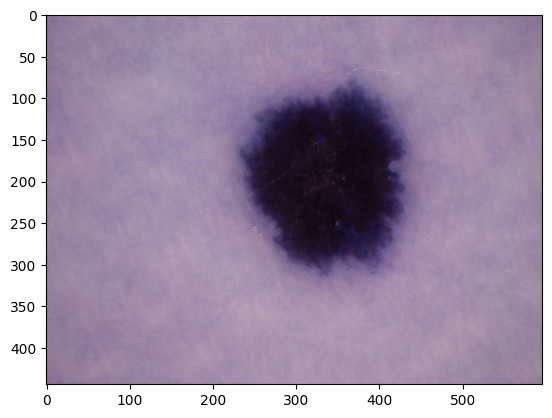

In [5]:
plt.imshow(image)

## Thresholding

### Testing

In [4]:
image_zyx = convert2zyx(image)   

In [5]:
# color conversion
# image_xyz = cv2.cvtColor(image, cv2.COLOR_BGR2XYZ)

r_norm = image[:,:,2]*(1/np.sqrt(np.sum(image.astype(np.float32)**2, axis=-1))) # + np.finfo(float).eps
x_norm = image_zyx[:,:,2]*(1/np.sqrt(np.sum(image_zyx.astype(np.float32)**2, axis=-1))) # + np.finfo(float).eps

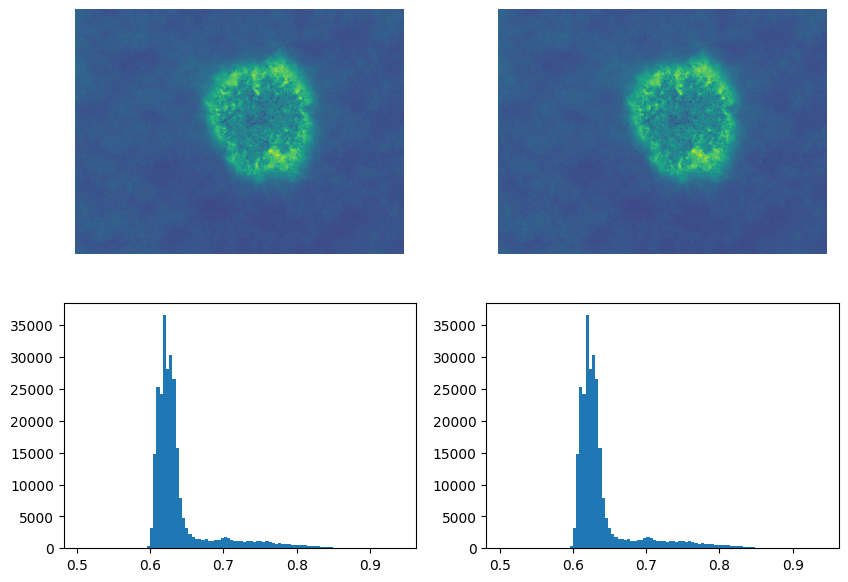

In [6]:
f,ax = plt.subplots(2,2,figsize=(10,7))
ax[0,0].imshow(r_norm), ax[0,1].imshow(x_norm), ax[0,0].axis('off'), ax[0,1].axis('off')
ax[1,0].hist(r_norm.flatten(), bins=100),ax[1,1].hist(x_norm.flatten(), bins=100)
plt.show()

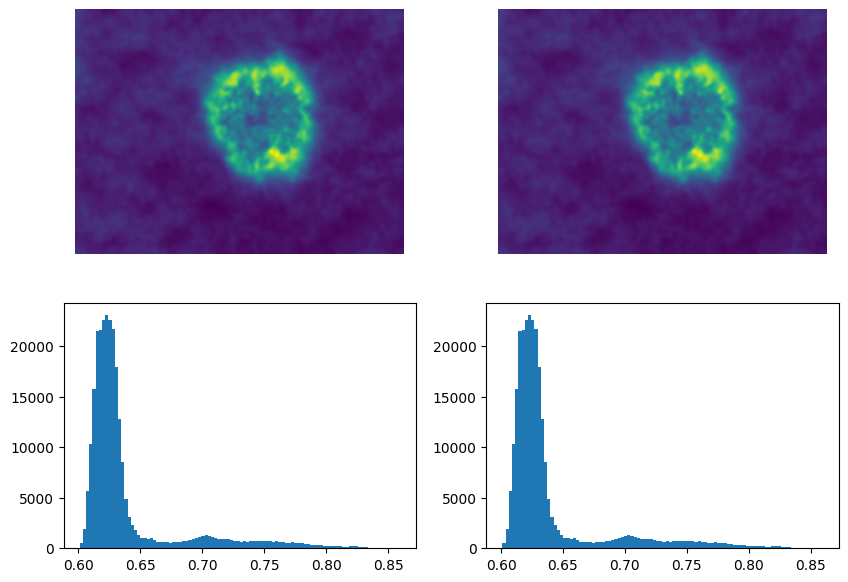

In [7]:
# gaussian smoothing
rnormg = cv2.GaussianBlur(r_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)
xnormg = cv2.GaussianBlur(x_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)
f,ax = plt.subplots(2,2,figsize=(10,7))
ax[0,0].imshow(rnormg), ax[0,1].imshow(xnormg), ax[0,0].axis('off'), ax[0,1].axis('off')
ax[1,0].hist(rnormg.flatten(), bins=100),ax[1,1].hist(xnormg.flatten(), bins=100)
plt.show()

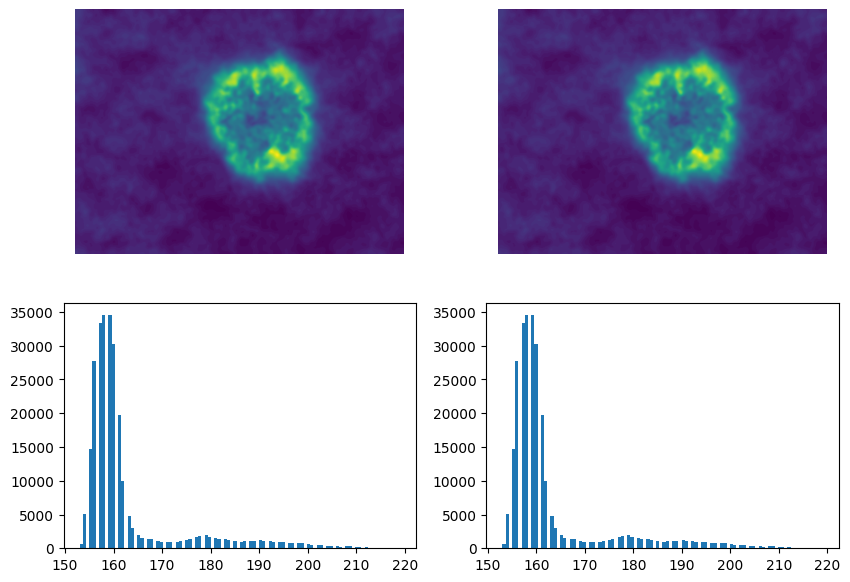

In [9]:
rnormg = (rnormg*255).astype(np.uint8)
xnormg = (xnormg*255).astype(np.uint8)
f,ax = plt.subplots(2,2,figsize=(10,7))
ax[0,0].imshow(rnormg), ax[0,1].imshow(xnormg), ax[0,0].axis('off'), ax[0,1].axis('off')
ax[1,0].hist(rnormg.flatten(), bins=100),ax[1,1].hist(xnormg.flatten(), bins=100)
plt.show()

In [9]:
# # global threshold

# values, counts = np.unique(rnormg, return_counts=True)
# # values = values.astype(np.float32)
# # counts = counts.astype(np.float32)
# n_total = counts.sum() # scalar
# p_i = counts/n_total # vector
# mu_t = np.sum(values*p_i) # scalar
# mu_k = np.asarray([np.sum(p_i[:i+1]*values[:i+1]) for i in range(values.shape[0])])
# omega_k = np.asarray([np.sum(p_i[:i+1]) for i in range(p_i.shape[0])])
# sigma2b_k = ((mu_t*omega_k - mu_k)**2) / (omega_k*(1-omega_k))


/tmp/ipykernel_16979/2306907046.py:11: RuntimeWarning: invalid value encountered in divide
  sigma2b_k = ((mu_t*omega_k - mu_k)**2) / (omega_k*(1-omega_k))


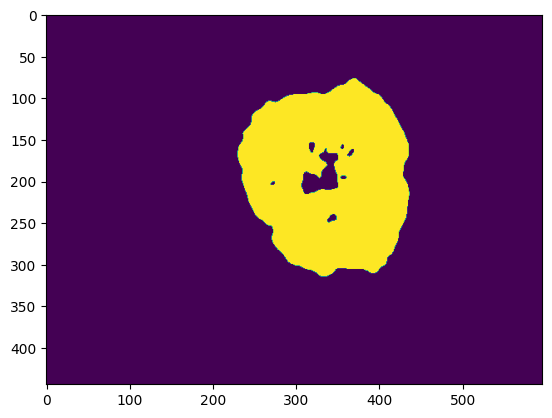

In [10]:
ret,mask = cv2.threshold(rnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(mask)

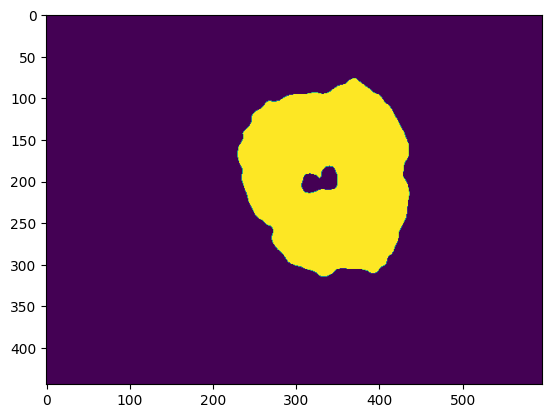

In [11]:
e_element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
morph = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, e_element)
plt.imshow(morph)

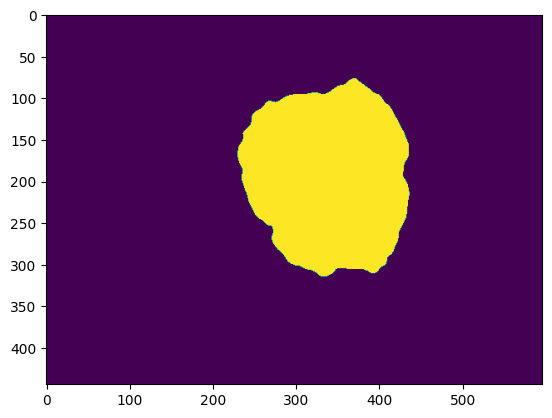

In [13]:
# des = cv2.bitwise_not(mask)
contour,hier = cv2.findContours(mask,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

for cnt in contour:
    cv2.drawContours(mask,[cnt],0,255,-1)

# gray = cv2.bitwise_not(mask)
plt.imshow(mask)

### Multiple examples

In [32]:
seg_examples[0].keys()

dict_keys(['idx', 'type', 'problem', 'label', 'img'])

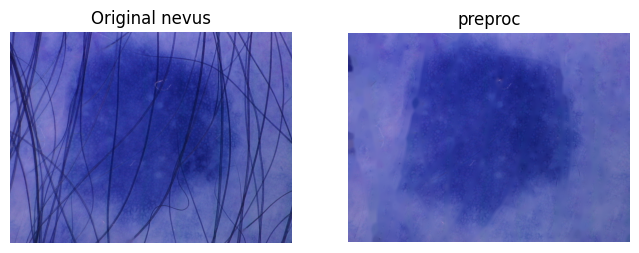

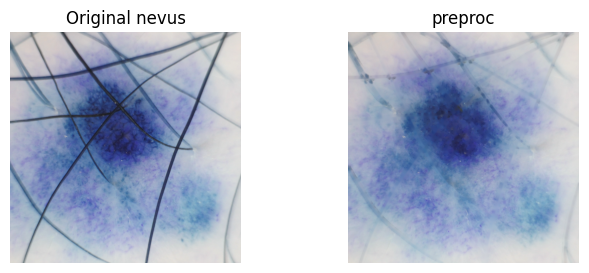

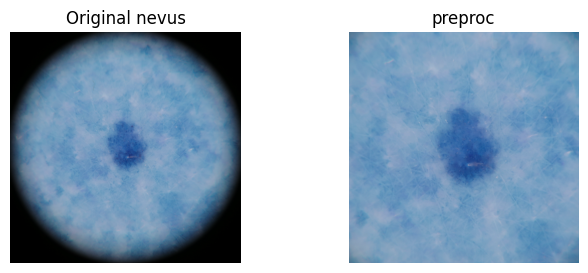

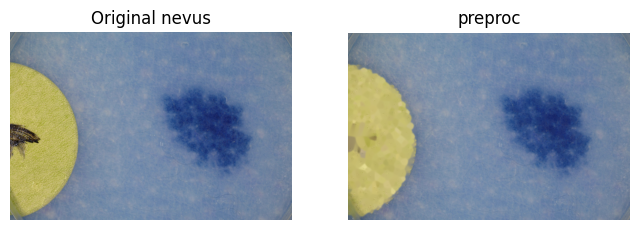

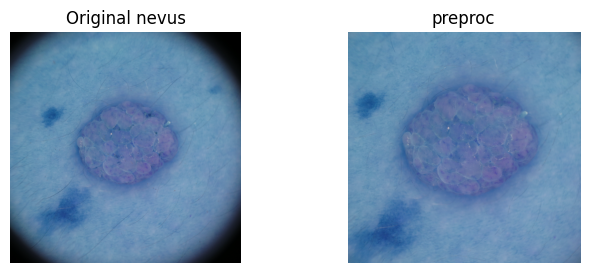

...

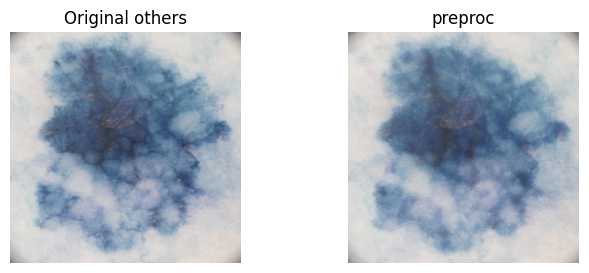

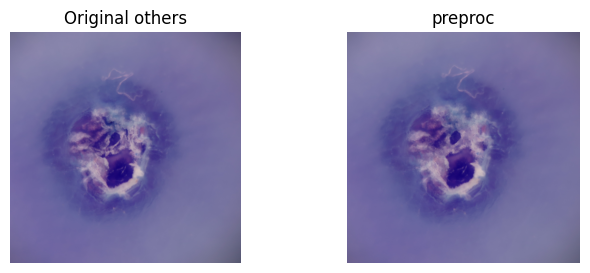

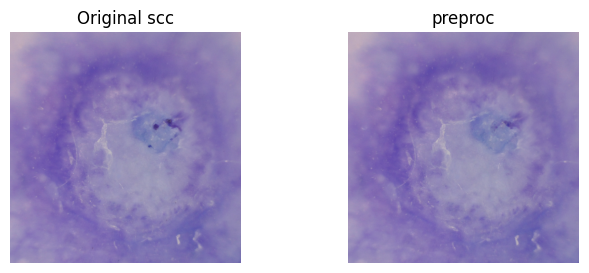

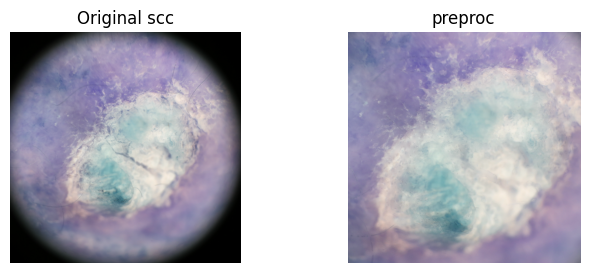

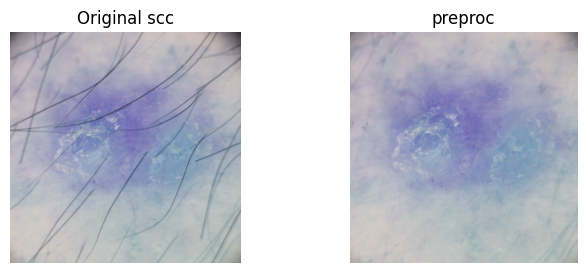

In [33]:
# visualize preprocessed images

for i in range(68):
    if seg_examples[i]['type'] != 'medium':
        continue
    image = seg_examples[i]['img']
    image_p = preprocess.preprocess(image)

    f,ax = plt.subplots(1,2,figsize=(8,3))
    label = seg_examples[i]['label']
    ax[0].imshow(image), ax[0].axis('off'), ax[0].set_title(f'Original {label}')
    ax[1].imshow(image_p), ax[1].axis('off'), ax[1].set_title(f'preproc')

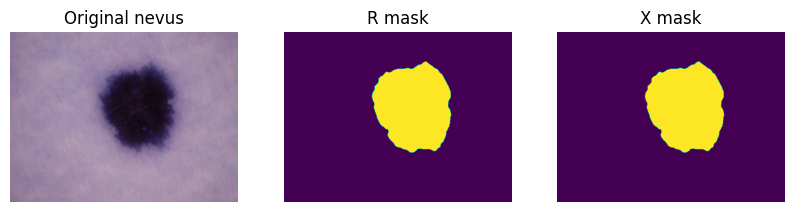

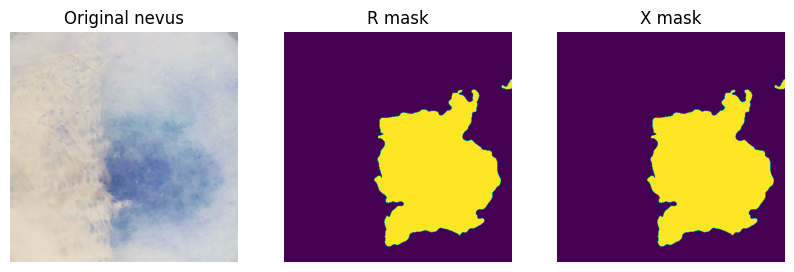

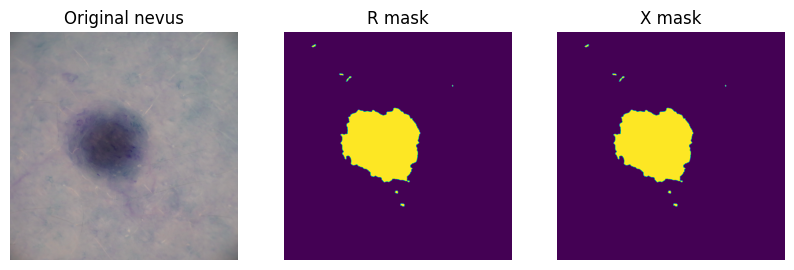

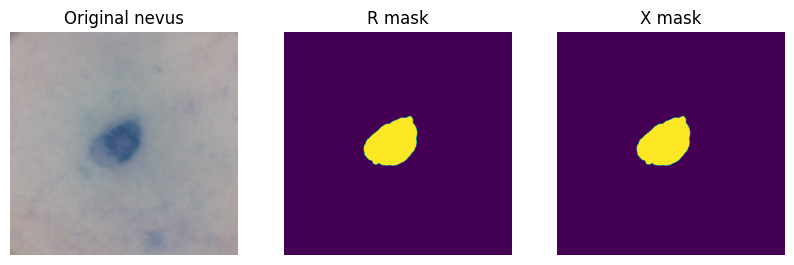

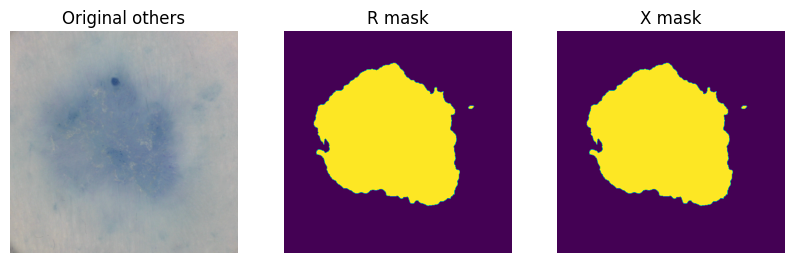

...

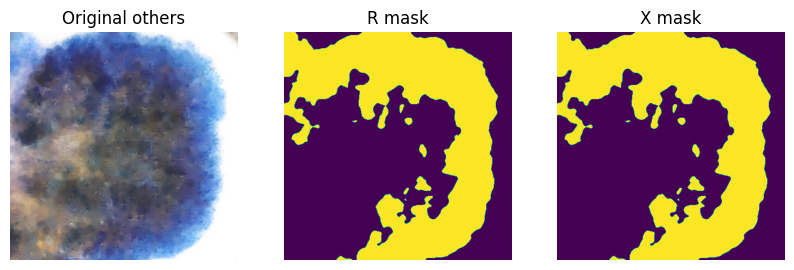

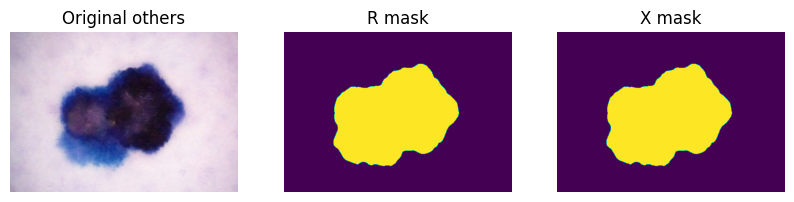

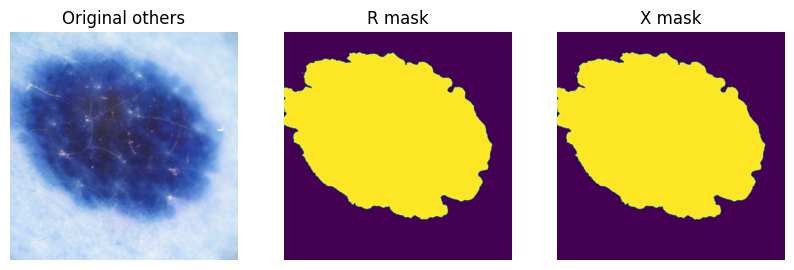

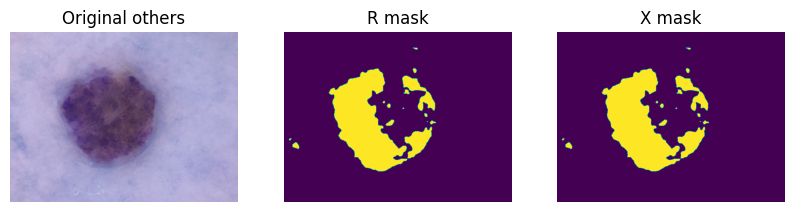

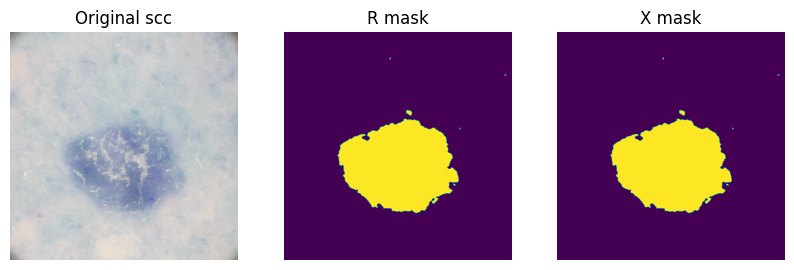

In [30]:
# easy

for i in range(68):
    if seg_examples[i]['type'] != 'easy':
        continue
    image = preprocess.preprocess(seg_examples[i]['img'])
    image_zyx = convert2zyx(image)  
    # image_xyz = cv2.cvtColor(image, cv2.COLOR_BGR2XYZ)

    # Get R and X channel and normalize
    r_norm = image[:,:,2]*(1/np.sqrt(np.sum(image.astype(np.float32)**2, axis=-1)))
    x_norm = image_zyx[:,:,2]*(1/np.sqrt(np.sum(image_zyx.astype(np.float32)**2, axis=-1)))
    # x_norm = image_xyz[:,:,1]*(1/np.sqrt(np.sum(image_xyz.astype(np.float32)**2, axis=-1)))

    # Gaussian blurring 
    rnormg = (cv2.GaussianBlur(r_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)*255).astype(np.uint8)
    xnormg = (cv2.GaussianBlur(x_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)*255).astype(np.uint8)

    # Global thresholding
    _,mask_r = cv2.threshold(rnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    _,mask_x = cv2.threshold(xnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # Filling holes
    contour_r,_ = cv2.findContours(mask_r,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contour_r:
        cv2.drawContours(mask_r,[cnt],0,255,-1)
    
    contour_x,_ = cv2.findContours(mask_x,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contour_x:
        cv2.drawContours(mask_x,[cnt],0,255,-1)

    f,ax = plt.subplots(1,3,figsize=(10,3))
    label = seg_examples[i]['label']
    ax[0].imshow(image), ax[0].axis('off'), ax[0].set_title(f'Original {label}')
    ax[1].imshow(mask_r), ax[1].axis('off'), ax[1].set_title(f'R mask')
    ax[2].imshow(mask_x), ax[2].axis('off'), ax[2].set_title(f'X mask') 
    

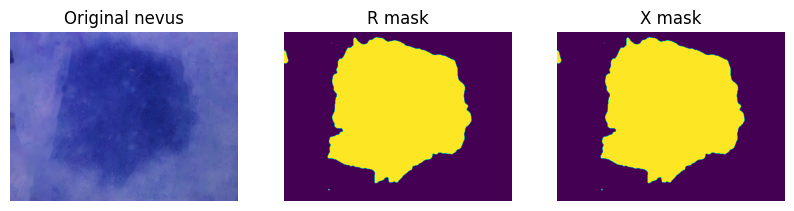

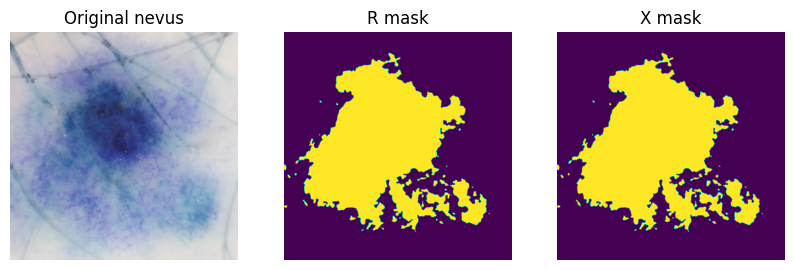

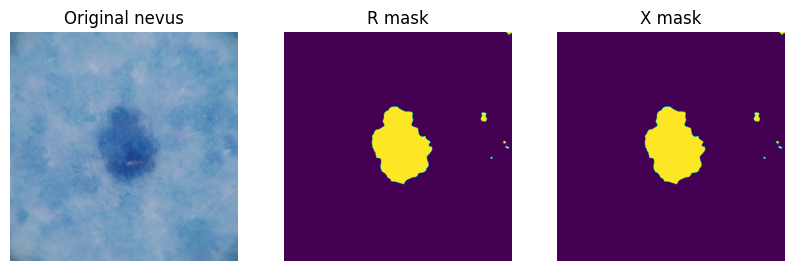

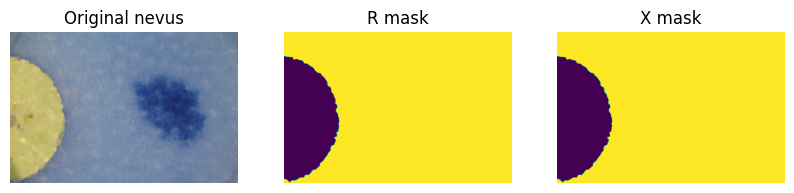

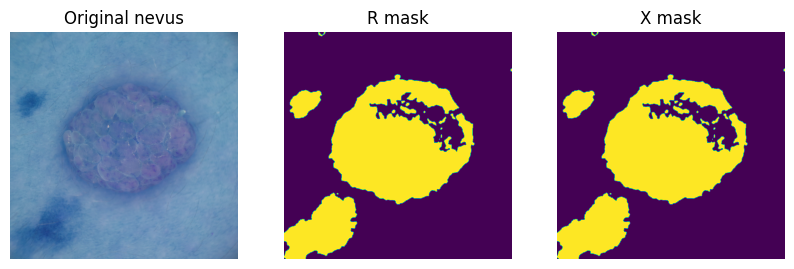

...

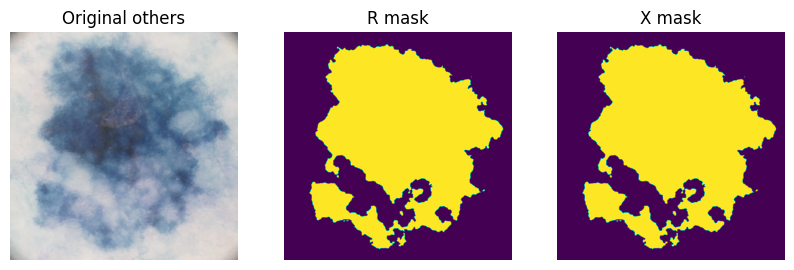

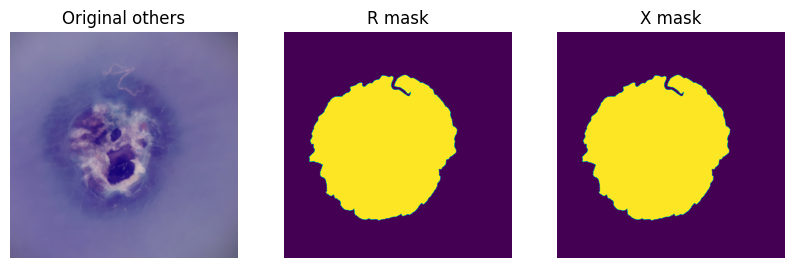

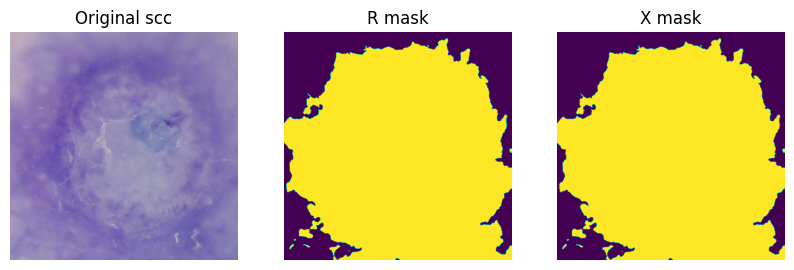

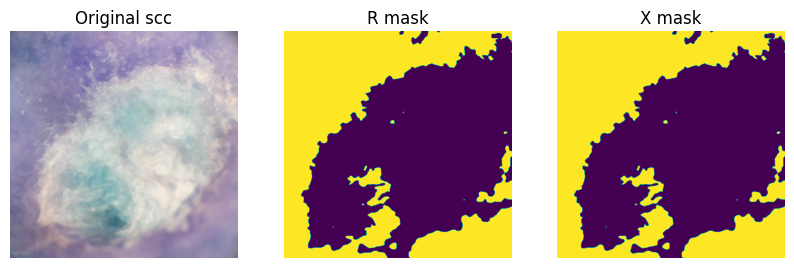

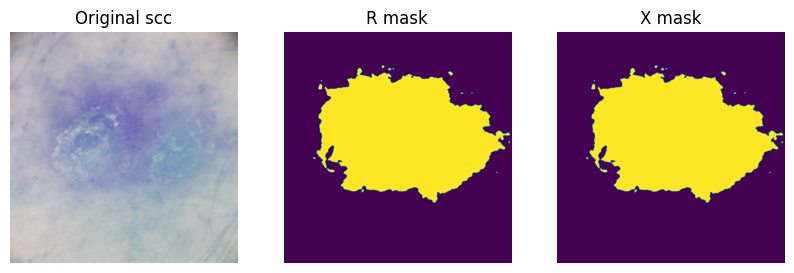

In [31]:
# medium
for i in range(68):
    if seg_examples[i]['type'] != 'medium':
        continue
    image = preprocess.preprocess(seg_examples[i]['img'])
    image_zyx = convert2zyx(image)  
    # image_xyz = cv2.cvtColor(image, cv2.COLOR_BGR2XYZ)

    # Get R and X channel and normalize
    r_norm = image[:,:,2]*(1/np.sqrt(np.sum(image.astype(np.float32)**2, axis=-1)))
    x_norm = image_zyx[:,:,2]*(1/np.sqrt(np.sum(image_zyx.astype(np.float32)**2, axis=-1)))
    # x_norm = image_xyz[:,:,1]*(1/np.sqrt(np.sum(image_xyz.astype(np.float32)**2, axis=-1)))

    # Gaussian blurring 
    rnormg = (cv2.GaussianBlur(r_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)*255).astype(np.uint8)
    xnormg = (cv2.GaussianBlur(x_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)*255).astype(np.uint8)

    # Global thresholding
    _,mask_r = cv2.threshold(rnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    _,mask_x = cv2.threshold(xnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # Filling holes
    contour_r,_ = cv2.findContours(mask_r,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contour_r:
        cv2.drawContours(mask_r,[cnt],0,255,-1)
    
    contour_x,_ = cv2.findContours(mask_x,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contour_x:
        cv2.drawContours(mask_x,[cnt],0,255,-1)

    f,ax = plt.subplots(1,3,figsize=(10,3))
    label = seg_examples[i]['label']
    idx = seg_examples[i]['idx']
    ax[0].imshow(image), ax[0].axis('off'), ax[0].set_title(f'Original {label}')
    ax[1].imshow(mask_r), ax[1].axis('off'), ax[1].set_title(f'R mask')
    ax[2].imshow(mask_x), ax[2].axis('off'), ax[2].set_title(f'X mask') 

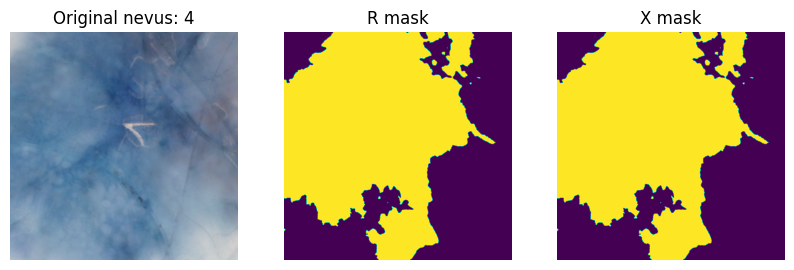

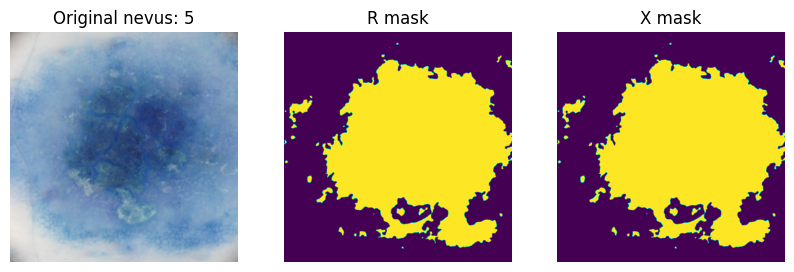

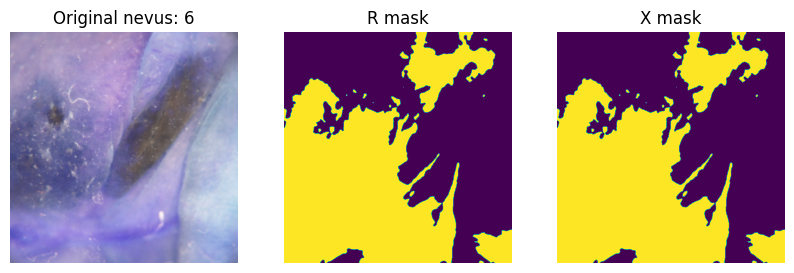

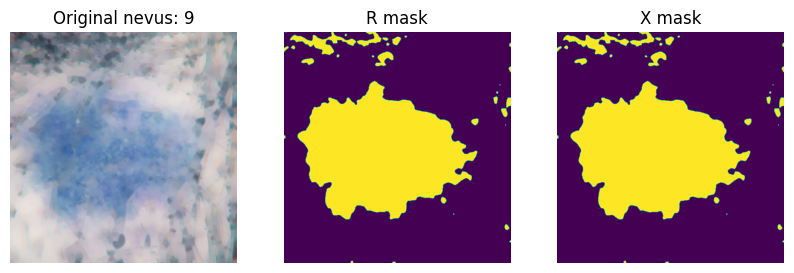

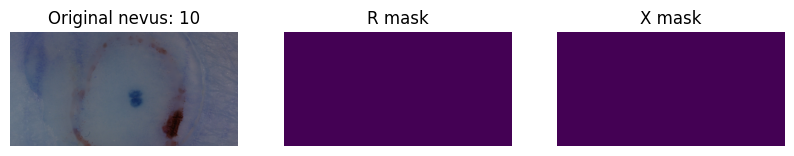

...

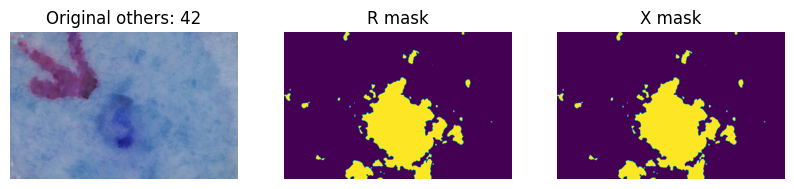

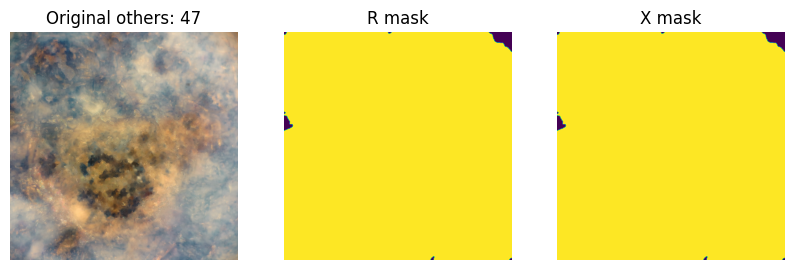

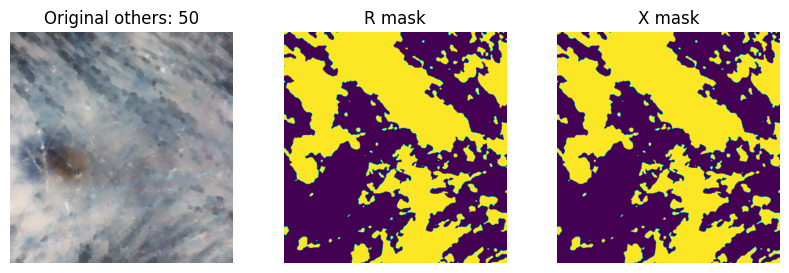

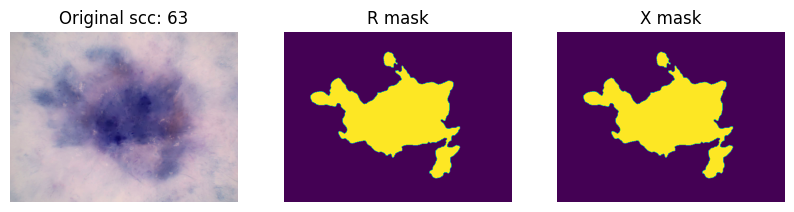

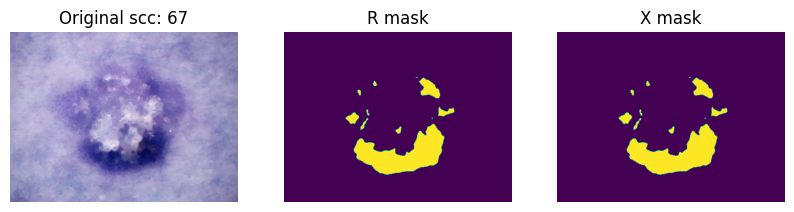

In [34]:
# hard

for i in range(68):
    if seg_examples[i]['type'] != 'hard':
        continue
    image = preprocess.preprocess(seg_examples[i]['img'])
    image_zyx = convert2zyx(image)  
    # image_xyz = cv2.cvtColor(image, cv2.COLOR_BGR2XYZ)

    # Get R and X channel and normalize
    r_norm = image[:,:,2]*(1/np.sqrt(np.sum(image.astype(np.float32)**2, axis=-1)))
    x_norm = image_zyx[:,:,2]*(1/np.sqrt(np.sum(image_zyx.astype(np.float32)**2, axis=-1)))
    # x_norm = image_xyz[:,:,1]*(1/np.sqrt(np.sum(image_xyz.astype(np.float32)**2, axis=-1)))

    # Gaussian blurring 
    rnormg = (cv2.GaussianBlur(r_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)*255).astype(np.uint8)
    xnormg = (cv2.GaussianBlur(x_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)*255).astype(np.uint8)

    # Global thresholding
    _,mask_r = cv2.threshold(rnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    _,mask_x = cv2.threshold(xnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # Filling holes
    contour_r,_ = cv2.findContours(mask_r,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contour_r:
        cv2.drawContours(mask_r,[cnt],0,255,-1)
    
    contour_x,_ = cv2.findContours(mask_x,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contour_x:
        cv2.drawContours(mask_x,[cnt],0,255,-1)

    f,ax = plt.subplots(1,3,figsize=(10,3))
    label = seg_examples[i]['label']
    idx = seg_examples[i]['idx']
    ax[0].imshow(image), ax[0].axis('off'), ax[0].set_title(f'Original {label}: {idx}')
    ax[1].imshow(mask_r), ax[1].axis('off'), ax[1].set_title(f'R mask')
    ax[2].imshow(mask_x), ax[2].axis('off'), ax[2].set_title(f'X mask') 

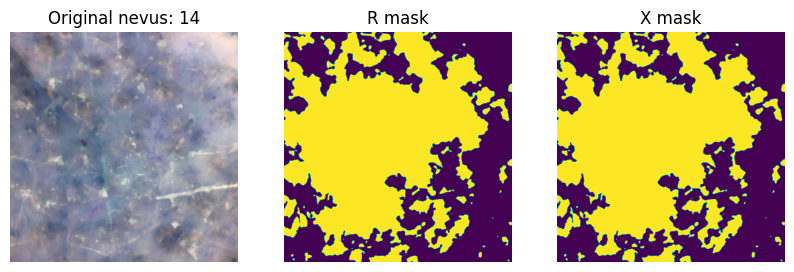

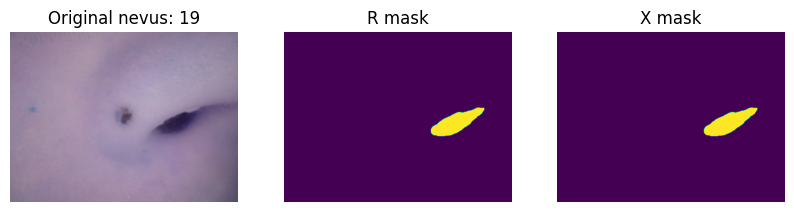

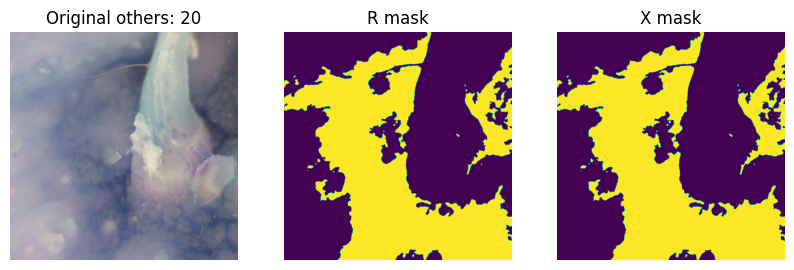

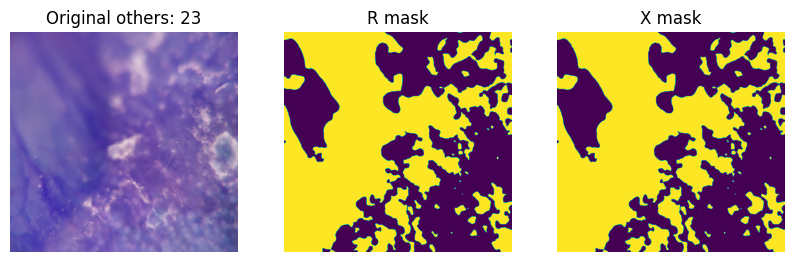

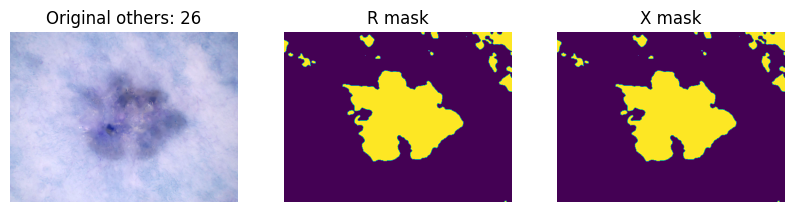

...

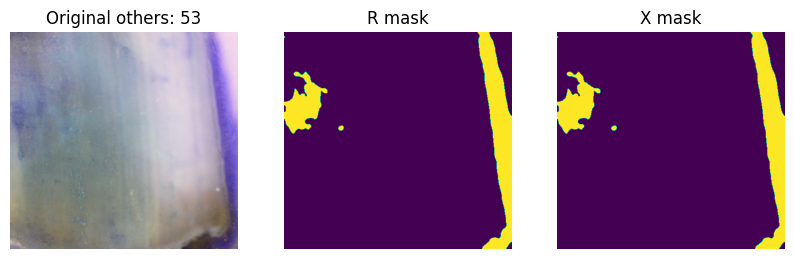

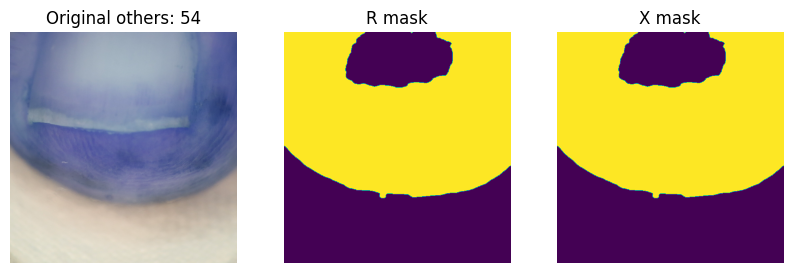

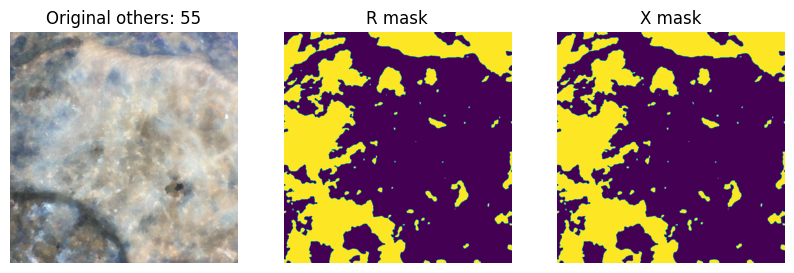

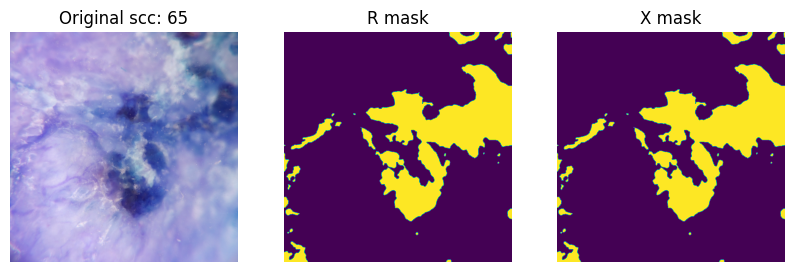

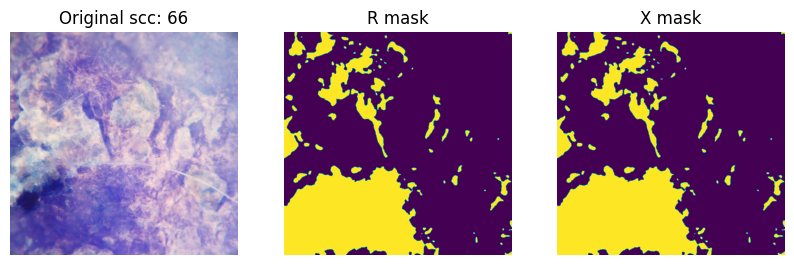

In [35]:
# vhard

for i in range(68):
    if seg_examples[i]['type'] != 'vhard':
        continue
    image = preprocess.preprocess(seg_examples[i]['img'])
    image_zyx = convert2zyx(image)  
    # image_xyz = cv2.cvtColor(image, cv2.COLOR_BGR2XYZ)

    # Get R and X channel and normalize
    r_norm = image[:,:,2]*(1/np.sqrt(np.sum(image.astype(np.float32)**2, axis=-1)))
    x_norm = image_zyx[:,:,2]*(1/np.sqrt(np.sum(image_zyx.astype(np.float32)**2, axis=-1)))
    # x_norm = image_xyz[:,:,1]*(1/np.sqrt(np.sum(image_xyz.astype(np.float32)**2, axis=-1)))

    # Gaussian blurring 
    rnormg = (cv2.GaussianBlur(r_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)*255).astype(np.uint8)
    xnormg = (cv2.GaussianBlur(x_norm, ksize = (0,0), sigmaX=3, borderType = cv2.BORDER_DEFAULT)*255).astype(np.uint8)

    # Global thresholding
    _,mask_r = cv2.threshold(rnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    _,mask_x = cv2.threshold(xnormg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # Filling holes
    contour_r,_ = cv2.findContours(mask_r,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contour_r:
        cv2.drawContours(mask_r,[cnt],0,255,-1)
    
    contour_x,_ = cv2.findContours(mask_x,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contour_x:
        cv2.drawContours(mask_x,[cnt],0,255,-1)

    f,ax = plt.subplots(1,3,figsize=(10,3))
    label = seg_examples[i]['label']
    idx = seg_examples[i]['idx']
    ax[0].imshow(image), ax[0].axis('off'), ax[0].set_title(f'Original {label}: {idx}')
    ax[1].imshow(mask_r), ax[1].axis('off'), ax[1].set_title(f'R mask')
    ax[2].imshow(mask_x), ax[2].axis('off'), ax[2].set_title(f'X mask') 